In [1]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import pandas as pd
import cv2

from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

import lpips
import face_alignment
# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

from LoadData import CelebADataset, Rescale,ToTensor, imshow, ObfuscaionToTensor, CelebADataset_test, Rescale_test,ObfuscaionToTensor_test
# from Image_reconstructor_ressuper import en_deconv_ressuper
from Image_reconstructor_res import Encoder_Decoder_Residual
# from s3fd import s3fd
from Discrimnator_ResNet import ResNet, Bottleneck
from Discriminator_ResNet50 import ResNet2, ResNet200
# from Image_reconstructor_super import en_deconv_super
from Image_reconstructor_UGATIT import ResnetGenerator
from sklearn.utils import shuffle
from run import Network
from net_canny import Net

# # train_on_gpu = 0
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    device='cpu'
    print('CUDA is not available.')
else:
    device='cuda'
    print('CUDA is available.')

CUDA is available.


In [2]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
from skimage.filters import threshold_isodata, threshold_mean, try_all_threshold, unsharp_mask, wiener, LPIFilter2D
from skimage.filters import gaussian, median, laplace, scharr, meijering, inverse, roberts, sato, rank_order, hessian
from skimage.filters.rank import mean_percentile
from skimage.transform import rescale, resize, downscale_local_mean
from skimage.util import img_as_float, random_noise
from skimage.morphology import disk
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

class CelebADataset(Dataset):
  

    def __init__(self, data_frame, transform=None,obfuscation=False, sigma=0):

        self.data_frame = data_frame
        self.transform = transform
        self.obfuscation = obfuscation
        self.sigma = sigma

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        if self.obfuscation:
            image = io.imread(self.data_frame.iloc[idx, 1]) 
            image = resize(image, (128, 128),
                       anti_aliasing=True)
#             obfus_image = io.imread(self.data_frame.iloc[idx, 2], as_gray=True)
#             obfus_image = resize(obfus_image, (128, 128),
#                        anti_aliasing=True)
#             grayscale image
#             image = io.imread(self.data_frame.iloc[idx, 1], as_gray=True)          
#             image = image.tolist()
#             image= np.asarray(image, dtype="int32" )
#             obfus_image = random_noise(image, var=1)
#             obfus_image = swirl(image, rotation=0, strength=10, radius=120)
#             obfus_image = resize(image, (15, 15),
#                        anti_aliasing=True)
#             obfus_image = gaussian(image, sigma=self.sigma, multichannel=False)
            obfus_image = gaussian(image, sigma=self.sigma)
#             obfus_image = median(image, disk(9))
#             obfus_image = laplace(image, ksize=3, mask=None)
#             obfus_image = unsharp_mask(image, radius=12)
#             obfus_image = hessian(image)
            labels = self.data_frame.iloc[idx, 0]
            labels = np.array(labels)
            labels = labels.astype(np.float)
            sample = {'image': image,'obfuscated': obfus_image, 'labels': labels}
           
        else:     
            image = io.imread(self.data_frame.iloc[idx, 1])
            labels = self.data_frame.iloc[idx, 0]
            labels = np.array(labels)
            labels = labels.astype(np.float)
            sample = {'image': image, 'labels': labels}

        if self.transform:
            sample = self.transform(sample)
        return sample
    


class Rescale(object):
    """Rescale the image in a sample to a given size.

    Args:
        output_size (tuple or int): Desired output size. If tuple, output is
            matched to output_size. If int, smaller of image edges is matched
            to output_size keeping aspect ratio the same.
    """

    def __init__(self, output_size_height,output_size_width,obfuscation=False):
        assert isinstance(output_size_height, (int, tuple))
        assert isinstance(output_size_width, (int, tuple))
        self.output_size_height = output_size_height
        self.output_size_width = output_size_width
        self.obfuscation = obfuscation

    def __call__(self, sample):
        
            
              
        new_h, new_w = self.output_size_height,self.output_size_width
        new_h, new_w = int(new_h), int(new_w)
        if self.obfuscation:
            image, obfus_image, labels = sample['image'],sample['obfuscated'], sample['labels']
            obfus_image = transform.resize(obfus_image, (new_h, new_w))
            img = transform.resize(image, (new_h, new_w))
            return {'image': img,'obfuscated': obfus_image, 'labels': labels}
        else:
            image, labels = sample['image'], sample['labels']
            img = transform.resize(image, (new_h, new_w))
            return {'image': img, 'labels': labels}


    
class ToTensor(object):
    """Convert ndarrays in sample to Tensors."""
    


    def __call__(self, sample):
        image, labels = sample['image'], sample['labels']

#         image = image.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image),
                'labels': torch.from_numpy(labels)}

class ObfuscaionToTensor(object):
    """Convert ndarrays in sample to Tensors."""


    def __call__(self, sample):
        image, obfus_image, labels = sample['image'],sample['obfuscated'], sample['labels']
#         for grayscale image!!!!!!!!!!!!
#         obfus_image = np.expand_dims(obfus_image, axis=2)
#         image = np.expand_dims(image, axis=2)
#         print(torch.from_numpy(image).shape())
        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W
        image = image.transpose((2, 0, 1))
        obfus_image = obfus_image.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image),
                'obfuscated': torch.from_numpy(obfus_image),
                'labels': torch.from_numpy(labels)}
    
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    plt.imshow(np.transpose(img, (1, 2, 0)))  # convert from Tensor image

1082


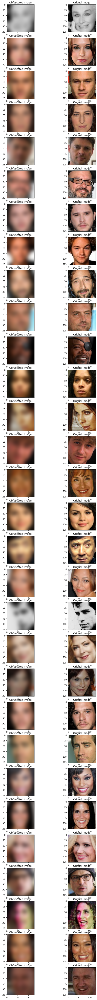

In [3]:
# filepath = 'C:/Users/13862/Desktop/Dataset/CelebA/'
# pathidentity=filepath+'Anno/CelebAIdentity512-459.pkl'

# filepath = 'C:/Users/13862/Desktop/Dataset/'
# pathidentity=filepath+'FaceScrubGANobf.pkl'

filepath = 'C:/Users/13862/Desktop/Dataset/'
pathidentity=filepath+'FaceScrubIdentity.pkl'


data = pd.read_pickle(pathidentity)
# df=data[data['identity']==0]
# dataframe=data[data['identity']==1]
# df=df.append(dataframe)
df=data
np.random.seed(33)
df = shuffle(df)
part=len(df)//10
print(part)
df_train = df[:int(8*part)]
df_test = df[int(8*part):int(9*part)]
df_val = df[int(9*part):]
size=128

face_dataset_train = CelebADataset(df_train,transform=transforms.Compose([
                                               Rescale(size,size,obfuscation=True),
                                               ObfuscaionToTensor()
                                           ]),obfuscation=True, sigma=9)
face_dataset_test = CelebADataset(df_test,transform=transforms.Compose([
                                               Rescale(size,size,obfuscation=True),
                                               ObfuscaionToTensor()
                                           ]),obfuscation=True, sigma=9)
face_dataset_val = CelebADataset(df_val,transform=transforms.Compose([
                                               Rescale(size,size,obfuscation=True),
                                               ObfuscaionToTensor()
                                           ]),obfuscation=True, sigma=9)

# face_dataset_train = CelebADataset(df_train,transform=transforms.Compose([
#                                                Rescale(128,128),
#                                                ToTensor()
#                                            ]))
# face_dataset_test = CelebADataset(df_test,transform=transforms.Compose([
#                                                Rescale(128,128),
#                                                ToTensor()
#                                            ]))
# face_dataset_val = CelebADataset(df_val,transform=transforms.Compose([
#                                                Rescale(128,128),
#                                                ToTensor()
#                                            ]))


fig, axs = plt.subplots(30, 2,figsize=(10,90))
grayscale = False
for i in range(len(face_dataset_test)):
    sample =  face_dataset_test[i]
    image=sample['image']
    obfus_image=sample['obfuscated']  
    image=image.float().detach().cpu()
    obfus_image=obfus_image.float().detach().cpu()
    if grayscale == False:
        axs[i, 0].imshow(np.transpose(obfus_image, (1, 2, 0)))
        axs[i, 0].set_title('Obfuscated Image')
        axs[i, 1].imshow(np.transpose(image, (1, 2, 0)))
        axs[i, 1].set_title('Orignal Image')
    else:
        axs[i, 0].imshow(np.transpose(obfus_image, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i, 0].set_title('Obfuscated Image')
        axs[i, 1].imshow(np.transpose(image, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i, 1].set_title('Orignal Image')
#     print(sample['labels'].numpy())
    if i == 29:
#         plt.show()
        break

In [4]:
def grayscale_RGB(img):
    img = img.repeat(1, 3, 1, 1)
    return img

In [5]:
batch_size=1
num_workers=0
dataloader = DataLoader(face_dataset_train, batch_size=batch_size,
                        shuffle=True, num_workers=num_workers)

dataloader_test = DataLoader(face_dataset_test, batch_size=1,
                        shuffle=False, num_workers=num_workers)

dataloader_val = DataLoader(face_dataset_val, batch_size=batch_size,
                        shuffle=True, num_workers=num_workers)


In [6]:
# Discriminator_compare=VGG19(nn.Module)
Discriminator_compare=ResNet(Bottleneck, [3, 4, 6, 3])
# Face_detector = s3fd()

In [7]:

# faceoutlinedetector = Net()
# for param in faceoutlinedetector.parameters():
#     param.requires_grad = True
    
# if train_on_gpu:
#     faceoutlinedetector.cuda()

In [8]:
Discriminator_compare

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [9]:
# Discriminator_compare.load_state_dict(torch.load('Discriminator_ResNet50grayscale.pt'))########for grayscale
# Discriminator_compare.load_state_dict(torch.load('Discriminator_ResNet50GenderG.pt'))
Discriminator_compare.load_state_dict(torch.load('Discriminator_ResNet50NEW.pt'))
# Discriminator_compare.load_state_dict(torch.load('Discriminator_ResNet50NEW200.pt'))
for param in Discriminator_compare.parameters():
    param.requires_grad = False

if train_on_gpu:
    Discriminator_compare.cuda()

In [10]:
import torch
import torch.nn as nn
from torch.nn.parameter import Parameter

class ResnetGenerator(nn.Module):
    def __init__(self,Discriminator_compare, input_nc=3, output_nc=3, ngf=64, n_blocks=6, img_size=128, light=False,
                ):
        assert(n_blocks >= 0)
        super(ResnetGenerator, self).__init__()
        self.input_nc = input_nc
        self.output_nc = output_nc
        self.ngf = ngf
        self.n_blocks = n_blocks
        self.img_size = img_size
        self.light = light

        DownBlock = []
        DownBlock += [nn.ReflectionPad2d(3),
                      nn.Conv2d(input_nc, ngf, kernel_size=7, stride=1, padding=0, bias=False),
                      nn.InstanceNorm2d(ngf),
                      nn.LeakyReLU(0.1)]

        # Down-Sampling
        n_downsampling = 2
        for i in range(n_downsampling):
            mult = 2**i
            DownBlock += [nn.ReflectionPad2d(1),
                          nn.Conv2d(ngf * mult, ngf * mult * 2, kernel_size=3, stride=2, padding=0, bias=False),
                          nn.InstanceNorm2d(ngf * mult * 2),
                          nn.LeakyReLU(0.1)]
            
        encoder = []
        encoder += [nn.ReflectionPad2d(3),
                      nn.Conv2d(input_nc, ngf, kernel_size=7, stride=1, padding=0, bias=False),
                      nn.InstanceNorm2d(ngf),
                      nn.LeakyReLU(0.1)]

        for i in range(n_downsampling):
            if i == n_downsampling-1:
                stride = 2
            else:
                stride = 1
            mult = 2**i
            encoder += [nn.ReflectionPad2d(1),
                          nn.Conv2d(ngf * mult, ngf * mult * 2, kernel_size=3, stride=stride, padding=0, bias=False),
                          nn.InstanceNorm2d(ngf * mult * 2),
                          nn.LeakyReLU(0.1)]
            

        # Down-Sampling Bottleneck
        mult = 2**n_downsampling
        head_blocks = []
        for _ in range(4):
            block = ResnetBlock(256, 2)
            head_blocks.append(block)
            
        self.head = nn.Sequential(*head_blocks)
        self.HeadComBlock = CombConv(512, 256)
        
        middle_blocks = []
        for _ in range(6):
            block = ResnetBlock(256, 1)
            middle_blocks.append(block)
          
        self.middle = nn.Sequential(*middle_blocks)
        # Class Activation Map
        self.gap_fc = nn.Linear(ngf * mult, 1, bias=False)
        self.gmp_fc = nn.Linear(ngf * mult, 1, bias=False)
        self.conv1x1 = nn.Conv2d(ngf * mult * 2, ngf * mult, kernel_size=1, stride=1, bias=True)
        self.relu = nn.ReLU(True)
        
        self.down_gap_fc = nn.Linear(ngf * mult, 1, bias=False)
        self.down_gmp_fc = nn.Linear(ngf * mult, 1, bias=False)
        self.down_conv1x1 = nn.Conv2d(ngf * mult * 2, ngf * mult, kernel_size=1, stride=1, bias=True)

        # Gamma, Beta block
        FC = [nn.Linear(img_size // mult * img_size // mult * ngf * mult, ngf * mult, bias=False),
              nn.ReLU(True),
              nn.Linear(ngf * mult, ngf * mult, bias=False),
              nn.ReLU(True)]
            
        down_FC = [nn.Linear(img_size // mult * img_size // mult * ngf * mult, ngf * mult, bias=False),
                  nn.ReLU(True),
                  nn.Linear(ngf * mult, ngf * mult, bias=False),
                  nn.ReLU(True)]
        
        self.gamma = nn.Linear(ngf * mult, ngf * mult, bias=False)
        self.beta = nn.Linear(ngf * mult, ngf * mult, bias=False)
        
        self.down_gamma = nn.Linear(ngf * mult, ngf * mult, bias=False)
        self.down_beta = nn.Linear(ngf * mult, ngf * mult, bias=False)

        # Up-Sampling Bottleneck
        for i in range(n_blocks):
            setattr(self, 'UpBlock1_' + str(i+1), ResnetAdaILNBlock(ngf * mult, use_bias=False))

        for i in range(4):
            setattr(self, 'Down_UpBlock1_' + str(i+1), ResnetAdaILNBlock(ngf * mult, use_bias=False))    
        
        # Up-Sampling
        decoder = []
        for i in range(n_downsampling):
            if i == 0:
                stride = 2
            else:
                stride = 1
            mult = 2**(n_downsampling - i)
            decoder += [nn.Upsample(scale_factor=2, mode='nearest'),
                         nn.ReflectionPad2d(1),
                         nn.Conv2d(ngf * mult, int(ngf * mult / 2), kernel_size=3, stride=stride, padding=0, bias=False),
                         ILN(int(ngf * mult / 2)),
                         nn.ReLU(True)]

        decoder += [nn.ReflectionPad2d(3),
                     nn.Conv2d(ngf, output_nc, kernel_size=7, stride=1, padding=0, bias=False),
                     nn.Tanh()]
        
        
        UpBlock2 = []
        for i in range(n_downsampling):
            mult = 2**(n_downsampling - i)
            UpBlock2 += [nn.Upsample(scale_factor=2, mode='nearest'),
                         nn.ReflectionPad2d(1),
                         nn.Conv2d(ngf * mult, int(ngf * mult / 2), kernel_size=3, stride=1, padding=0, bias=False),
                         ILN(int(ngf * mult / 2)),
                         nn.ReLU(True)]

        UpBlock2 += [nn.ReflectionPad2d(3),
                     nn.Conv2d(ngf, output_nc, kernel_size=7, stride=1, padding=0, bias=False),
                     nn.Tanh()]

        self.DownBlock = nn.Sequential(*DownBlock)
        self.decoder = nn.Sequential(*decoder)
        self.down_FC = nn.Sequential(*down_FC)
        self.FC = nn.Sequential(*FC)
        self.encoder = nn.Sequential(*encoder)
        self.UpBlock2 = nn.Sequential(*UpBlock2)
        
        self.discriminator = Discriminator_compare
 

    def forward(self, input):
        x_down = F.interpolate(input, scale_factor=0.5)

        x_down = self.encoder(x_down)
        x_down = self.head(x_down)

        x = self.DownBlock(input)
        inputt = x
        gap_weight_down = list(self.down_gap_fc.parameters())[0]
        gap_down = x_down * gap_weight_down.unsqueeze(2).unsqueeze(3)

        gmp_weight_down = list(self.down_gmp_fc.parameters())[0]
        gmp_down = x_down * gmp_weight_down.unsqueeze(2).unsqueeze(3)

        x_down = torch.cat([gap_down, gmp_down], 1)
        x_down = self.relu(self.down_conv1x1(x_down))


        x_down_ = self.down_FC(x_down.view(x_down.shape[0], -1))
        down_gamma, down_beta = self.down_gamma(x_down_), self.down_beta(x_down_)


        for i in range(4):
            x_down = getattr(self, 'Down_UpBlock1_' + str(i+1))(x_down, down_gamma, down_beta)     
        
        out_down = self.decoder(x_down)
#         out_outline = grayscale_RGB(out_outline)
#         out_outline = self.faceoutlinedetector(out_outline)
        x = torch.cat((x_down,inputt),1)
        x = self.HeadComBlock(x)
        x = self.middle(x)

        gap_weight = list(self.gap_fc.parameters())[0]
        gap = x * gap_weight.unsqueeze(2).unsqueeze(3)

        gmp_weight = list(self.gmp_fc.parameters())[0]
        gmp = x * gmp_weight.unsqueeze(2).unsqueeze(3)

        x = torch.cat([gap, gmp], 1)
        x = self.relu(self.conv1x1(x))


        if self.light:
            x_ = torch.nn.functional.adaptive_avg_pool2d(x, 1)
            x_ = self.FC(x_.view(x_.shape[0], -1))
        else:
            x_ = self.FC(x.view(x.shape[0], -1))
        gamma, beta = self.gamma(x_), self.beta(x_)


        for i in range(self.n_blocks):
            x = getattr(self, 'UpBlock1_' + str(i+1))(x, gamma, beta)
        out = self.UpBlock2(x)
        outclass = self.discriminator(out)
        return out, outclass, out_down

    
class CombConv(nn.Module):
    def __init__(self, dim1, dim2):
        super(CombConv, self).__init__()
        ComBlock = []
        ComBlock += [nn.Conv2d(dim1, dim2, kernel_size=3, stride=1, padding=1, bias=False),
                      nn.InstanceNorm2d(dim2),
                      nn.LeakyReLU(0.1)]
        self.ComBlock = nn.Sequential(*ComBlock)
        
    def forward(self, x):
        out = self.ComBlock(x)
        return out



class ResnetBlock(nn.Module):
    def __init__(self, dim, dilation=1, use_spectral_norm=False):
        super(ResnetBlock, self).__init__()
        self.conv_block = nn.Sequential(
            nn.ReflectionPad2d(dilation),
            nn.Conv2d(in_channels=dim, out_channels=dim, kernel_size=3, padding=0, dilation=dilation, bias=False),
            nn.InstanceNorm2d(dim, track_running_stats=False),
            nn.LeakyReLU(0.2),

            nn.ReflectionPad2d(1),
            nn.Conv2d(in_channels=dim, out_channels=dim, kernel_size=3, padding=0, dilation=1, bias=False),
            nn.InstanceNorm2d(dim, track_running_stats=False),
#             nn.Conv2d(in_channels=dim, out_channels=dim, kernel_size=1, padding=0),
#             nn.Sigmoid()
        )


    def forward(self, x):
        output = self.conv_block(x)
#         output = output*x+x
        output = output+x

        # Remove ReLU at the end of the residual block
        # http://torch.ch/blog/2016/02/04/resnets.html

        return output


    
class ResnetAdaILNBlock(nn.Module):
    def __init__(self, dim, use_bias):
        super(ResnetAdaILNBlock, self).__init__()
        self.pad1 = nn.ReflectionPad2d(1)
        self.conv1 = nn.Conv2d(dim, dim, kernel_size=3, stride=1, padding=0, bias=use_bias)
        self.norm1 = adaILN(dim)
        self.relu1 = nn.LeakyReLU(0.1)

        self.pad2 = nn.ReflectionPad2d(1)
        self.conv2 = nn.Conv2d(dim, dim, kernel_size=3, stride=1, padding=0, bias=use_bias)
        self.norm2 = adaILN(dim)

    def forward(self, x, gamma, beta):
        out = self.pad1(x)
        out = self.conv1(out)
        out = self.norm1(out, gamma, beta)
        out = self.relu1(out)
        out = self.pad2(out)
        out = self.conv2(out)
        out = self.norm2(out, gamma, beta)

        return out + x


class adaILN(nn.Module):
    def __init__(self, num_features, eps=1e-5):
        super(adaILN, self).__init__()
        self.eps = eps
        self.rho = Parameter(torch.Tensor(1, num_features, 1, 1))
        self.rho.data.fill_(0.9)

    def forward(self, input, gamma, beta):
        in_mean, in_var = torch.mean(input, dim=[2, 3], keepdim=True), torch.var(input, dim=[2, 3], keepdim=True)
        out_in = (input - in_mean) / torch.sqrt(in_var + self.eps)
        ln_mean, ln_var = torch.mean(input, dim=[1, 2, 3], keepdim=True), torch.var(input, dim=[1, 2, 3], keepdim=True)
        out_ln = (input - ln_mean) / torch.sqrt(ln_var + self.eps)
        out = self.rho.expand(input.shape[0], -1, -1, -1) * out_in + (1-self.rho.expand(input.shape[0], -1, -1, -1)) * out_ln
        out = out * gamma.unsqueeze(2).unsqueeze(3) + beta.unsqueeze(2).unsqueeze(3)

        return out


class ILN(nn.Module):
    def __init__(self, num_features, eps=1e-5):
        super(ILN, self).__init__()
        self.eps = eps
        self.rho = Parameter(torch.Tensor(1, num_features, 1, 1))
        self.gamma = Parameter(torch.Tensor(1, num_features, 1, 1))
        self.beta = Parameter(torch.Tensor(1, num_features, 1, 1))
        self.rho.data.fill_(0.0)
        self.gamma.data.fill_(1.0)
        self.beta.data.fill_(0.0)

    def forward(self, input):
        in_mean, in_var = torch.mean(input, dim=[2, 3], keepdim=True), torch.var(input, dim=[2, 3], keepdim=True)
        out_in = (input - in_mean) / torch.sqrt(in_var + self.eps)
        ln_mean, ln_var = torch.mean(input, dim=[1, 2, 3], keepdim=True), torch.var(input, dim=[1, 2, 3], keepdim=True)
        out_ln = (input - ln_mean) / torch.sqrt(ln_var + self.eps)
        out = self.rho.expand(input.shape[0], -1, -1, -1) * out_in + (1-self.rho.expand(input.shape[0], -1, -1, -1)) * out_ln
        out = out * self.gamma.expand(input.shape[0], -1, -1, -1) + self.beta.expand(input.shape[0], -1, -1, -1)

        return out



In [11]:
model=ResnetGenerator(Discriminator_compare)
# model = Encoder_Decoder_Residual(Discriminator_compare)

if train_on_gpu:
    model.cuda()
 
model

ResnetGenerator(
  (head): Sequential(
    (0): ResnetBlock(
      (conv_block): Sequential(
        (0): ReflectionPad2d((2, 2, 2, 2))
        (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), dilation=(2, 2), bias=False)
        (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (3): LeakyReLU(negative_slope=0.2)
        (4): ReflectionPad2d((1, 1, 1, 1))
        (5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), bias=False)
        (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      )
    )
    (1): ResnetBlock(
      (conv_block): Sequential(
        (0): ReflectionPad2d((2, 2, 2, 2))
        (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), dilation=(2, 2), bias=False)
        (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (3): LeakyReLU(negative_slope=0.2)
        (4): ReflectionPad2d((1, 1, 1, 1))
        (5): Conv2d

In [12]:
# recordD = 0
# recordF = 0
# counterD = 0
# counterF = 0
# model_dictD = torch.load('Discriminator_ResNet50NEW.pt')
# model_dictF = torch.load('s3fd-619a316812.pth')
# for name,layer in model._modules.items():
#     recordD = recordD +1
#     if name=='discrminator':
#         break

# for name,layer in model._modules.items():
#     recordF = recordF +1
#     if name=='detector':
#         break
        
# for child in model.children():
# #     print(child)
#     counterD = counterD +1
#     counterF = counterF + 1
#     if counterD == recordD:
# #         print(child)
#         own_state = child.state_dict()
#         for name,Pretrained_param in model_dictD.items():
#             print(name)
#             if name not in own_state:
#                  continue
#             if isinstance(Pretrained_param, Parameter):
#                 # backwards compatibility for serialized parameters
#                 Pretrained_param = Pretrained_param.data
#             own_state[name].copy_(Pretrained_param)
# #             if torch.equal(own_state[name],Pretrained_param):
# #                 print('true')
# #             else:
# #                 print(name)
# #                 print('false')
#         for param in child.parameters():
#             param.requires_grad = True

#     if counterF == recordF:
#         #         print(child)
#         own_state = child.state_dict()
#         for name,Pretrained_param in model_dictF.items():
#             if name not in own_state:
#                  continue
#             if isinstance(Pretrained_param, Parameter):
#                 # backwards compatibility for serialized parameters
#                 Pretrained_param = Pretrained_param.data
# #             print(Pretrained_param.size())
# #             print('------------------------------------------------------')
# #             print(own_state[name].size())
#             own_state[name].copy_(Pretrained_param)
# #             own_state[name].requires_grad = False
#         for param in child.parameters():
#             param.requires_grad = True

            

In [12]:
# criterion = nn.CrossEntropyLoss()

# # # specify optimizer
# optimizer = optim.SGD(model.parameters(), lr=0.01)

# criterion = torch.nn.MSELoss()
criterion = torch.nn.MSELoss(reduction = 'sum')
criterionL1 = torch.nn.L1Loss(reduction = 'sum')
# criterionL1 = torch.nn.L1Loss()
# discriminator_criterion = lpips.LPIPS(net='vgg').cuda()
# discriminator_criterion = lpips.LPIPS().cuda()
# optimizer = torch.optim.Adam(model.parameters(), lr=0.00007)
optimizer = torch.optim.Adam(model.parameters())


In [14]:
# def plot_grad_flow(named_parameters):
#     '''Plots the gradients flowing through different layers in the net during training.
#     Can be used for checking for possible gradient vanishing / exploding problems.
    
#     Usage: Plug this function in Trainer class after loss.backwards() as 
#     "plot_grad_flow(self.model.named_parameters())" to visualize the gradient flow'''
#     ave_grads = []
#     max_grads= []
#     layers = []
#     for n, p in named_parameters:
#         if(p.requires_grad) and ("bias" not in n):
#             layers.append(n)
#             ave_grads.append(p.grad.abs().mean())
#             max_grads.append(p.grad.abs().max())
#     print(ave_grads)
#     print(max_grads)

In [28]:
n_epochs = 70
# valid_loss_min = np.Inf # track change in validation loss
valid_loss_min = 3990
weight = 0.00002
# weight = 0.00002
# gamma = 0.005
# alpha = 1.25
for epoch in range(1, n_epochs+1):
    torch.cuda.empty_cache()
    # keep track of training and validation loss
    train_loss = 0.0
    valid_loss = 0.0
    
    ###################
    # train the model #
    ###################
    model.train()
    for i_batch, sample_batched in enumerate(dataloader):
        images_batch,obfus_image_batch, labels_batch = \
                sample_batched['image'],sample_batched['obfuscated'], sample_batched['labels']
        img=images_batch.float()
        obf_image=obfus_image_batch.float()
        target = labels_batch.long()
        if train_on_gpu:
            img, obf_image, target = img.cuda(), obf_image.cuda(), target.cuda()

        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model
#         output, output_class = model(obf_image)
        output, output_class, outline = model(obf_image)
        out1, out2, out3, out4,_ = output_class
        print(out1.size())
        print(out2.size())
        print(out3.size())
        print(out4.size())
        print(img_down.size())
        print(img.size())
        gtout1, gtout2, gtout3, gtout4,_ = Discriminator_compare(img)
#         loss = criterionL1(output, img)
#         loss = weight * (3*criterion(out4,gtout4)) + (criterionL1(output, img))
#         loss = weight * (0.3*criterion(out1,gtout1) + 0.5*criterion(out2,gtout2) + criterion(out3,gtout3) 
#                          +1.8*criterion(out4,gtout4)) + (criterionL1(output, img))
        img_down = F.interpolate(img, scale_factor=0.5)
        loss = weight * (0.3*criterion(out1,gtout1) + 0.5*criterion(out2,gtout2) + criterion(out3,gtout3) 
                         +1.8*criterion(out4,gtout4)) + (criterionL1(output, img) + 2 * criterionL1(outline, img_down))
       


#         loss = weight * (0.3*criterion(out1,gtout1) + 0.5*criterion(out2,gtout2) + criterion(out3,gtout3) 
#                          +1.8*criterion(out4,gtout4)) + (criterionL1(output, img) + 
#                                                             1.2 * criterionL1(out_down, img_down))
#                                                                  0.1 * criterion(generated_outlinet, oringal_outlinet) +
#                                                                 0.2 * criterion(generated_outlinec, oringal_outlinec)))

#         oringal_outline = faceoutlinedetector(grayscale_RGB(img))

#         loss = criterion(output, img)
#         feature_output=get_features(obf_image,model, discriminator)
#         output = feature_output['Image_out']
#         feature_target=get_targetfeatures(img, discriminator)
# #         loss=torch.mean((feature_target['loss']-feature_output['loss'])**2)
#         loss=criterion(feature_target['loss'],feature_output['loss'])
#         loss = 0.75*loss + criterion(output, img)
#         loss = criterion(output, img)
#         loss = discriminator_criterion.forward(output,img)
#         print(loss)
        
        loss.backward()
#         plot_grad_flow(model.named_parameters())
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss
        train_loss += loss.item()*img.size(0)
#         print(train_loss)
    ######################    
    # validate the model #
    ######################
    model.eval()
    for i_batch, sample_batched in enumerate(dataloader_val):
        images_batch,obfus_image_batch, labels_batch = \
                sample_batched['image'],sample_batched['obfuscated'], sample_batched['labels']
        img=images_batch.float()
        obf_image=obfus_image_batch.float()
        target = labels_batch.long()
        if train_on_gpu:
            img, obf_image, target = img.cuda(), obf_image.cuda(), target.cuda()

 #         output, output_class = model(obf_image)
        output, output_class, outline = model(obf_image)
        out1, out2, out3, out4,_ = output_class

        gtout1, gtout2, gtout3, gtout4,_ = Discriminator_compare(img)
#         loss = criterionL1(output, img)
#         loss = weight * (3*criterion(out4,gtout4)) + (criterionL1(output, img))
#         loss = weight * (0.3*criterion(out1,gtout1) + 0.5*criterion(out2,gtout2) + criterion(out3,gtout3) 
#                          +1.8*criterion(out4,gtout4)) + (criterionL1(output, img))
        img_down = F.interpolate(img, scale_factor=0.5)
        loss = weight * (0.3*criterion(out1,gtout1) + 0.5*criterion(out2,gtout2) + criterion(out3,gtout3) 
                         +1.8*criterion(out4,gtout4)) + (criterionL1(output, img) + 2 * criterionL1(outline, img_down))


        # update average validation loss 
        valid_loss += loss.item()*img.size(0)
    
    # calculate average losses
    train_loss = train_loss/len(dataloader)
    valid_loss = valid_loss/len(dataloader_val)
        
    # print training/validation statistics 
    print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
        epoch, train_loss, valid_loss))
    
    # save model if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
        valid_loss_min,
        valid_loss))
        torch.save(model.state_dict(), '.pt')
        valid_loss_min = valid_loss




torch.Size([1, 256, 32, 32])
torch.Size([1, 512, 16, 16])
torch.Size([1, 1024, 8, 8])
torch.Size([1, 2048, 4, 4])
torch.Size([1, 3, 64, 64])
torch.Size([1, 3, 128, 128])
torch.Size([1, 256, 32, 32])
torch.Size([1, 512, 16, 16])
torch.Size([1, 1024, 8, 8])
torch.Size([1, 2048, 4, 4])
torch.Size([1, 3, 64, 64])
torch.Size([1, 3, 128, 128])
torch.Size([1, 256, 32, 32])
torch.Size([1, 512, 16, 16])
torch.Size([1, 1024, 8, 8])
torch.Size([1, 2048, 4, 4])
torch.Size([1, 3, 64, 64])
torch.Size([1, 3, 128, 128])
torch.Size([1, 256, 32, 32])
torch.Size([1, 512, 16, 16])
torch.Size([1, 1024, 8, 8])
torch.Size([1, 2048, 4, 4])
torch.Size([1, 3, 64, 64])
torch.Size([1, 3, 128, 128])
torch.Size([1, 256, 32, 32])
torch.Size([1, 512, 16, 16])
torch.Size([1, 1024, 8, 8])
torch.Size([1, 2048, 4, 4])
torch.Size([1, 3, 64, 64])
torch.Size([1, 3, 128, 128])
torch.Size([1, 256, 32, 32])
torch.Size([1, 512, 16, 16])
torch.Size([1, 1024, 8, 8])
torch.Size([1, 2048, 4, 4])
torch.Size([1, 3, 64, 64])
torch.Siz

KeyboardInterrupt: 

In [25]:
# model = Encoder_Decoder_Residual()
# # model = en_deconv_super()
# print(model)

# # move tensors to GPU if CUDA is available
# # if train_on_gpu:
# model.cuda() 

# model.load_state_dict(torch.load('Image_reconstructor_res_doubleloss_pixel1515.pt'))
# model.load_state_dict(torch.load('Image_reconstructor_Resdown_new.pt'))
model.load_state_dict(torch.load('Image_reconstructor_UGATITdown3new.pt'))

<All keys matched successfully>

In [23]:
model.load_state_dict(torch.load('model_cifar.pt'))

<All keys matched successfully>

In [17]:
TestLoss = torch.nn.L1Loss()

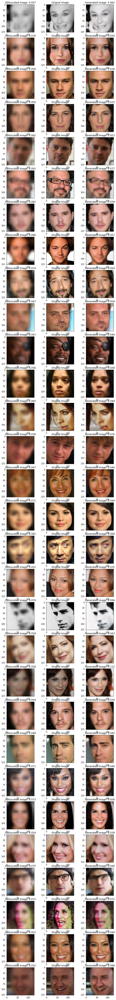

In [19]:
acc=0
counter=0
counter1=0
model.eval()
# iterate over test data
counter=0
# grayscale = False
# fig = plt.figure(figsize=(25, 25))
fig, axs = plt.subplots(30, 3,figsize=(10,90))
for i_batch, sample_batched in enumerate(dataloader_test):
    images_batch,obfus_image_batch, labels_batch = \
                sample_batched['image'],sample_batched['obfuscated'], sample_batched['labels']
    img=images_batch.float()
    obf_image=obfus_image_batch.float()
    target = labels_batch.long()
    if train_on_gpu:
        img, obf_image, target = img.cuda(), obf_image.cuda(), target.cuda()
    output,_,_  = model(obf_image)
    obfloss = TestLoss(obf_image[0], img[0])
    obfloss = obfloss.float().detach().cpu().numpy()
    obfloss = float(obfloss)
    genloss = TestLoss(output[0], img[0])
    genloss=genloss.float().detach().cpu().numpy()
    genloss = float(genloss)

#     img = F.interpolate(img, scale_factor=0.5)
#     _,_,_,output = model(obf_image)
#     oringal_outline = faceoutlinedetector(grayscale_RGB(img))
#     obf_image = oringal_outline  
#     output = grayscale_RGB(output)
#     img = grayscale_RGB(img)
    obf_image=obf_image[0].float().detach().cpu()
    img=img[0].float().detach().cpu()
    output=output[0].float().detach().cpu()
    
    if grayscale == False:
        axs[i_batch, 0].imshow(np.transpose(obf_image, (1, 2, 0)))
        axs[i_batch, 0].set_title('Obfuscated Image: %.3f' % (obfloss))
        axs[i_batch, 1].imshow(np.transpose(img, (1, 2, 0)))
        axs[i_batch, 1].set_title('Orignal Image')
        axs[i_batch, 2].imshow(np.transpose(output, (1, 2, 0)))
        axs[i_batch, 2].set_title('Generated Image: %.3f' % (genloss))
    else:
        axs[i_batch, 0].imshow(np.transpose(obf_image, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i_batch, 0].set_title('Obfuscated Image: %.3f' % (obfloss))
        axs[i_batch, 1].imshow(np.transpose(img, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i_batch, 1].set_title('Orignal Image')
        axs[i_batch, 2].imshow(np.transpose(output, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i_batch, 2].set_title('Generated Image: %.3f' % (genloss))
        
    plt.savefig('C:/Users/13862/Desktop/ReconstructedImage', facecolor='w', edgecolor='w', bbox_inches='tight',pad_inches = 0)
#     plt.savefig('C:/Users/13862/Desktop/reconstructedImage', facecolor='w', edgecolor='w', bbox_inches='tight',pad_inches = 0)
    if i_batch==29:       
        break

In [22]:

model.eval()
worseloss=[0, 0, 0, 0, 0, 0, 0]
losssum = 0
counter = 0
# grayscale = False
# fig = plt.figure(figsize=(25, 25))
for i_batch, sample_batched in enumerate(dataloader_test):
    images_batch,obfus_image_batch, labels_batch = \
                sample_batched['image'],sample_batched['obfuscated'], sample_batched['labels']
    img=images_batch.float()
    obf_image=obfus_image_batch.float()
    target = labels_batch.long()
    if train_on_gpu:
        img, obf_image, target = img.cuda(), obf_image.cuda(), target.cuda()
    output,_,_  = model(obf_image)
    obfloss = TestLoss(obf_image[0], img[0])
    obfloss = obfloss.float().detach().cpu().numpy()
    obfloss = float(obfloss)
    genloss = TestLoss(output[0], img[0])
    genloss=genloss.float().detach().cpu().numpy()
    genloss = float(genloss)
    losssum = losssum + genloss
    counter += 1
    for i in range(len(worseloss)):
        if genloss > worseloss[i]:
            if genloss < worseloss[i+1]:
                worseloss[i] = genloss
            if genloss > worseloss[i+1] and i==len(worseloss)-2:
                worseloss[i+1] = genloss
        else:
            break

print(worseloss)
print(losssum/counter)

[0.11353564262390137, 0.11791394650936127, 0.12418286502361298, 0.13273762166500092, 0.15952461957931519, 0.23749247193336487, 0.2974492311477661]
0.0534400732209992


In [14]:
weight = 0.00002
model.eval()
worseloss=[0, 0, 0, 0, 0, 0, 0]
losssum = 0
counter = 0
pixel_loss_1 = 0
pixel_loss_2 = 0
pre_loss_1 = 0
# grayscale = False
# fig = plt.figure(figsize=(25, 25))
for i_batch, sample_batched in enumerate(dataloader_test):
    images_batch,obfus_image_batch, labels_batch = \
                sample_batched['image'],sample_batched['obfuscated'], sample_batched['labels']
    img=images_batch.float()
    obf_image=obfus_image_batch.float()
    target = labels_batch.long()
    if train_on_gpu:
        img, obf_image, target = img.cuda(), obf_image.cuda(), target.cuda()
        output, output_class, outline = model(obf_image)
        out1, out2, out3, out4,_ = output_class

        gtout1, gtout2, gtout3, gtout4,_ = Discriminator_compare(img)
#         loss = criterionL1(output, img)
#         loss = weight * (3*criterion(out4,gtout4)) + (criterionL1(output, img))
#         loss = weight * (0.3*criterion(out1,gtout1) + 0.5*criterion(out2,gtout2) + criterion(out3,gtout3) 
#                          +1.8*criterion(out4,gtout4)) + (criterionL1(output, img))
        img_down = F.interpolate(img, scale_factor=0.5)
        loss = weight * (0.3*criterion(out1,gtout1) + 0.5*criterion(out2,gtout2) + criterion(out3,gtout3) 
                         +1.8*criterion(out4,gtout4)) 
        l1_loss = criterionL1(output, img)
        half_l1_loss = 2 * criterionL1(outline, img_down)


        # update average validation loss 
        pixel_loss_1 += l1_loss.item()*img.size(0)
        pixel_loss_2 += half_l1_loss.item()*img.size(0)
        pre_loss_1 += loss.item()*img.size(0)
    
    # calculate average losses
pixel_loss_1 = pixel_loss_1/len(dataloader_test)
pixel_loss_2 = pixel_loss_2/len(dataloader_test)
pre_loss_1 = pre_loss_1/len(dataloader_test)

print(pixel_loss_1)
print(pixel_loss_2)
print(pre_loss_1)

19970.905099244745
10000.277813077633
18.074699856216938


In [19]:
def PSNR(original, compressed):
#     print(original)
    original = original.astype(np.float64)
    compressed = compressed.astype(np.float64)
    mse = np.mean((original - compressed) ** 2)
#     print(mse)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = original.max()-original.min()
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr


from skimage.metrics import structural_similarity as ssim


In [20]:
acc=0
counter=0
counter1=0
model.eval()
# iterate over test data
counter=0
PSNRsum=0
PSNRobfsum=0
SSIMsum =0
SSIMobfsum = 0
# model.load_state_dict(torch.load('Image_reconstructor_Resdown_p151570212.pt'))
for i_batch, sample_batched in enumerate(dataloader_test):
    images_batch,obfus_image_batch, labels_batch = \
                sample_batched['image'],sample_batched['obfuscated'], sample_batched['labels']
    img=images_batch.float()
    obf_image=obfus_image_batch.float()
    target = labels_batch.long()
    if train_on_gpu:
        img, obf_image, target = img.cuda(), obf_image.cuda(), target.cuda()
    output,_,_  = model(obf_image)
    img = img[0].float().cpu().detach().numpy()
    output= output[0].float().cpu().detach().numpy()
    obf_image = obf_image[0].float().cpu().detach().numpy()
    
    obf_image=np.transpose(obf_image, (1, 2, 0))
    img=np.transpose(img, (1, 2, 0))
    output=np.transpose(output, (1, 2, 0))

    PSNRgen = PSNR(output, img)
    PSNRsum = PSNRsum + PSNRgen
    PSNRobf = PSNR(obf_image, img)
    PSNRobfsum = PSNRobfsum + PSNRobf

    SSIMgen = ssim(img, output,data_range=img.max() - img.min(), multichannel=True)
    SSIMsum = SSIMsum + SSIMgen
    SSIMobf = ssim(img, obf_image,data_range=img.max() - img.min(), multichannel=True)
    SSIMobfsum = SSIMobfsum + SSIMobf
    counter = counter + 1
print(PSNRsum/counter)
print(PSNRobfsum/counter)
print(SSIMsum/counter)
print(SSIMobfsum/counter)


23.035134180859046
17.620208228718482
0.7482233741609865
0.4793256834596633


In [19]:

acc=0
counter=0
counter1=0
model.eval()
# iterate over test data
counter=0
# grayscale = False
# fig = plt.figure(figsize=(25, 25))
losssum = 0
for i_batch, sample_batched in enumerate(dataloader_test):
    images_batch,obfus_image_batch, labels_batch = \
                sample_batched['image'],sample_batched['obfuscated'], sample_batched['labels']
    img=images_batch.float()
    obf_image=obfus_image_batch.float()
    target = labels_batch.long()
    if train_on_gpu:
        img, obf_image, target = img.cuda(), obf_image.cuda(), target.cuda()
    output,_  = model(obf_image)
    obfloss = TestLoss(obf_image[0], img[0])
    obfloss = obfloss.float().detach().cpu().numpy()
    obfloss = float(obfloss)
    genloss = TestLoss(output[0], img[0])
    genloss=genloss.float().detach().cpu().numpy()
    genloss = float(genloss)

#     img = F.interpolate(img, scale_factor=0.5)
#     _,_,_,output = model(obf_image)
#     oringal_outline = faceoutlinedetector(grayscale_RGB(img))
#     obf_image = oringal_outline  
#     output = grayscale_RGB(output)
#     img = grayscale_RGB(img)
    obf_image=obf_image[0].float().detach().cpu()
    img=img[0].float().detach().cpu()
    output=output[0].float().detach().cpu()
    gen = ms_ssim( output, img, data_range=255, size_average=True )
    losssum = losssum + gen
print(losssum)


ValueError: Input images should be 4-d or 5-d tensors, but got torch.Size([3, 128, 128])

In [19]:
class CelebADataset_test(Dataset):
  

    def __init__(self, data_frame, transform=None,obfuscation=False, sigma=0):

        self.data_frame = data_frame
        self.transform = transform
        self.obfuscation = obfuscation
        self.sigma = sigma

    def __len__(self):
        return len(self.data_frame)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        if self.obfuscation:
            # gray scale image
#             image = io.imread(self.data_frame.iloc[idx, 1], as_gray=True)  
            image = io.imread(self.data_frame.iloc[idx, 1]) 
#             obfus_image = gaussian(image, sigma=self.sigma, multichannel=True)
#             obfus_image = random_noise(image, var=1)
            obfus_image = resize(image, (10, 10),
                       anti_aliasing=True)
            original_image=obfus_image
#             image = np.array(image)
#             obfus_image = np.array(obfus_image)
            labels = self.data_frame.iloc[idx, 0]
            labels = np.array(labels)
            labels = labels.astype(np.float)
            sample = {'image': image,'obfuscated': obfus_image,'original':original_image, 'labels': labels}
           
        else:     
            image = io.imread(self.data_frame.iloc[idx, 1])
            labels = self.data_frame.iloc[idx, 0]
            labels = np.array(labels)
            labels = labels.astype(np.float)
            sample = {'image': image, 'labels': labels}

        if self.transform:
            sample = self.transform(sample)
        return sample
    



class Rescale_test(object):
    """Rescale the image in a sample to a given size.

    Args:
        output_size (tuple or int): Desired output size. If tuple, output is
            matched to output_size. If int, smaller of image edges is matched
            to output_size keeping aspect ratio the same.
    """

    def __init__(self, output_size_height,output_size_width,obfuscation=False):
        assert isinstance(output_size_height, (int, tuple))
        assert isinstance(output_size_width, (int, tuple))
        self.output_size_height = output_size_height
        self.output_size_width = output_size_width
        self.obfuscation = obfuscation

    def __call__(self, sample):
        
            
              
        new_h, new_w = self.output_size_height,self.output_size_width
        new_h, new_w = int(new_h), int(new_w)
        if self.obfuscation:
            image, obfus_image,original_obfus_image, labels = sample['image'],sample['obfuscated'],sample['original'], sample['labels']
#             original_obfus_image = transform.resize(obfus_image, (new_h, new_w))#########
            obfus_image = transform.resize(obfus_image, (new_h, new_w))
            img = transform.resize(image, (new_h, new_w))
            return {'image': img,'obfuscated': obfus_image,'original':original_obfus_image, 'labels': labels}
        else:
            image, labels = sample['image'], sample['labels']
            img = transform.resize(image, (new_h, new_w))
            return {'image': img, 'labels': labels}



class ObfuscaionToTensor_test(object):
    """Convert ndarrays in sample to Tensors."""


    def __call__(self, sample):
        image, obfus_image,original_obfus_image, labels = sample['image'],sample['obfuscated'],sample['original'], sample['labels']
        # gray scale image
#         obfus_image = np.expand_dims(obfus_image, axis=2)
#         image = np.expand_dims(image, axis=2)
#         original_obfus_image = np.expand_dims(original_obfus_image, axis=2)
        # swap color axis because
        # numpy image: H x W x C
        # torch image: C X H X W
        image = image.transpose((2, 0, 1))
        obfus_image = obfus_image.transpose((2, 0, 1))
        original_obfus_image = original_obfus_image.transpose((2, 0, 1))
        return {'image': torch.from_numpy(image),
                'obfuscated': torch.from_numpy(obfus_image),
                'original': torch.from_numpy(original_obfus_image),
                'labels': torch.from_numpy(labels)}
    
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    plt.imshow(np.transpose(img, (1, 2, 0)))  # convert from Tensor image

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


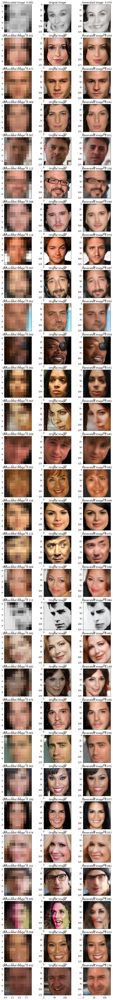

In [20]:
face_dataset_test = CelebADataset_test(df_test,transform=transforms.Compose([
                                               Rescale_test(size,size,obfuscation=True),
                                               ObfuscaionToTensor_test()
                                           ]),obfuscation=True, sigma=9)
dataloader_test = DataLoader(face_dataset_test, batch_size=1,
                        shuffle=False, num_workers=num_workers)

acc=0
counter=0
counter1=0

model.eval()
# iterate over test data
counter=0
# fig = plt.figure(figsize=(25, 25))
fig, axs = plt.subplots(30, 3,figsize=(10,90))
for i_batch, sample_batched in enumerate(dataloader_test):
    images_batch,obfus_image_batch,original_image_batch, labels_batch = \
                sample_batched['image'],sample_batched['obfuscated'],sample_batched['original'], sample_batched['labels']
    img=images_batch.float()
    obf_image=obfus_image_batch.float()
    original_image = original_image_batch.float()
    target = labels_batch.long()
    if train_on_gpu:
        img, obf_image,original_image, target = img.cuda(), obf_image.cuda(),original_image.cuda(), target.cuda()
    output,_,_ = model(obf_image)

    obfloss = TestLoss(obf_image[0], img[0])
    obfloss = obfloss.float().detach().cpu().numpy()
    obfloss = float(obfloss)
    genloss = TestLoss(output[0], img[0])
    genloss=genloss.float().detach().cpu().numpy()
    genloss = float(genloss)
    
    obf_image=obf_image[0].float().detach().cpu()
    img=img[0].float().detach().cpu()
    original_image=original_image[0].float().detach().cpu()
    output=output[0].float().detach().cpu()
    if grayscale == False:
        axs[i_batch, 0].imshow(np.transpose(original_image, (1, 2, 0)))
        axs[i_batch, 0].set_title('Obfuscated Image: %.3f' % (obfloss))
        axs[i_batch, 1].imshow(np.transpose(img, (1, 2, 0)))
        axs[i_batch, 1].set_title('Orignal Image')
        axs[i_batch, 2].imshow(np.transpose(output, (1, 2, 0)))
        axs[i_batch, 2].set_title('Generated Image: %.3f' % (genloss))
    
    else:
        axs[i_batch, 0].imshow(np.transpose(original_image, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i_batch, 0].set_title('Obfuscated Image: %.3f' % (obfloss))
        axs[i_batch, 1].imshow(np.transpose(img, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i_batch, 1].set_title('Orignal Image')
        axs[i_batch, 2].imshow(np.transpose(output, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i_batch, 2].set_title('Generated Image: %.3f' % (genloss))
        
    plt.savefig('C:/Users/13862/Desktop/reconstructedImage', bbox_inches='tight',pad_inches = 0)
    if i_batch==29:       
        break

In [55]:
"""
file - model.py
Implements the aesthemic model and emd loss used in paper.

Copyright (C) Yunxiao Shi 2017 - 2020
NIMA is released under the MIT license. See LICENSE for the fill license text.
"""

import torch
import torch.nn as nn

class NIMA(nn.Module):

    """Neural IMage Assessment model by Google"""
    def __init__(self, base_model, num_classes=10):
        super(NIMA, self).__init__()
        self.features = base_model.features
        self.classifier = nn.Sequential(
            nn.Dropout(p=0.75),
            nn.Linear(in_features=25088, out_features=num_classes),
            nn.Softmax())

    def forward(self, x):
        out = self.features(x)
        out = out.view(out.size(0), -1)
        out = self.classifier(out)
        return out


def single_emd_loss(p, q, r=2):
    """
    Earth Mover's Distance of one sample

    Args:
        p: true distribution of shape num_classes × 1
        q: estimated distribution of shape num_classes × 1
        r: norm parameter
    """
    assert p.shape == q.shape, "Length of the two distribution must be the same"
    length = p.shape[0]
    emd_loss = 0.0
    for i in range(1, length + 1):
        emd_loss += torch.abs(sum(p[:i] - q[:i])) ** r
    return (emd_loss / length) ** (1. / r)


def emd_loss(p, q, r=2):
    """
    Earth Mover's Distance on a batch

    Args:
        p: true distribution of shape mini_batch_size × num_classes × 1
        q: estimated distribution of shape mini_batch_size × num_classes × 1
        r: norm parameters
    """
    assert p.shape == q.shape, "Shape of the two distribution batches must be the same."
    mini_batch_size = p.shape[0]
    loss_vector = []
    for i in range(mini_batch_size):
        loss_vector.append(single_emd_loss(p[i], q[i], r=r))
    return sum(loss_vector) / mini_batch_size


In [47]:
# from NIMA import *

import torchvision.models as models
base_model = models.vgg16(pretrained=True)
base_model.classifier = torch.nn.Sequential(
)
image_qulity_access = NIMA(base_model)
try:
    image_qulity_access.load_state_dict(torch.load('epoch-82.pth'))
    print('successfully loaded model')
except:
    raise


if train_on_gpu:
    image_qulity_access.cuda()

successfully loaded model


In [48]:
# base_model

In [49]:
from PIL import Image
import numpy as np
from matplotlib import cm


test_transform = transforms.Compose([
    transforms.Resize(256), 
    
    transforms.RandomCrop(224), 
    transforms.ToTensor()
    ])

In [50]:
def image_quality(img):
#     output1 = np.transpose(img, (1, 2, 0))
#     print(output1.shape)
    output1 = transforms.ToPILImage()(img).convert("RGB")
#     display(output1)
#     output1 = transform.resize(output, (3,256, 256))
#     print(output1.shape)
#     output1 = Image.fromarray(np.uint8(output1)).convert('RGB')
    output1 = test_transform(output1)
    output1 = output1.unsqueeze(dim=0)
    
    

    output1 = output1.cuda()
    mean = 0
    std = 0
#     print(output1.size())
    with torch.no_grad():
        out = image_qulity_access(output1)
    out = out.view(10, 1)
    for j, e in enumerate(out, 1):
        mean += j * e
    for k, e in enumerate(out, 1):
        std += e * (k - mean) ** 2
    std = std ** 0.5
    return mean, std

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


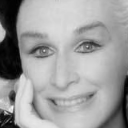

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


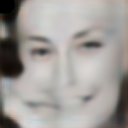

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


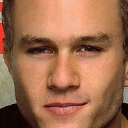

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


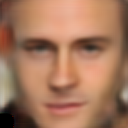

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


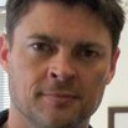

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


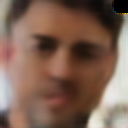

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


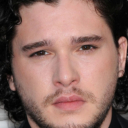

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


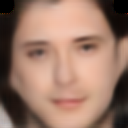

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


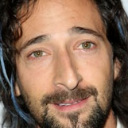

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


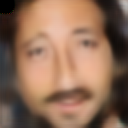

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


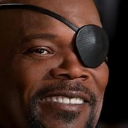

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


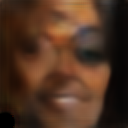

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


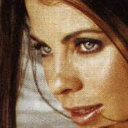

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


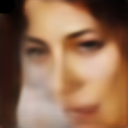

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


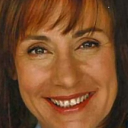

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


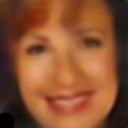

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


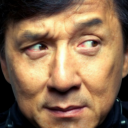

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


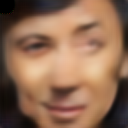

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


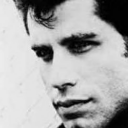

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


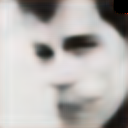

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


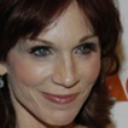

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


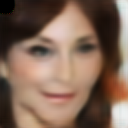

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


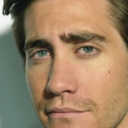

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


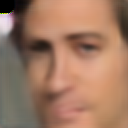

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


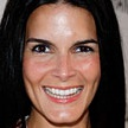

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


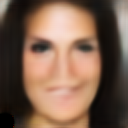

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


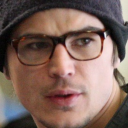

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


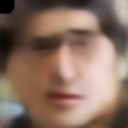

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


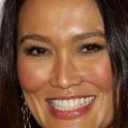

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


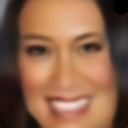

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


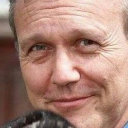

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


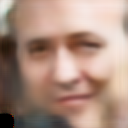

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


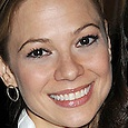

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


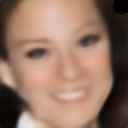

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


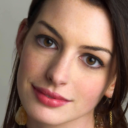

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


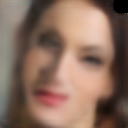

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


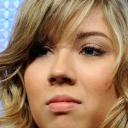

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


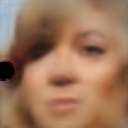

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


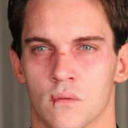

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


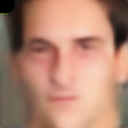

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


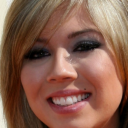

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


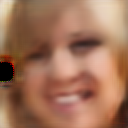

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


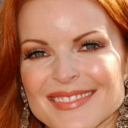

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


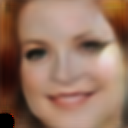

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


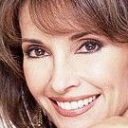

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


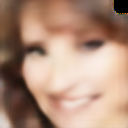

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


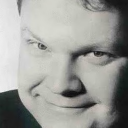

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


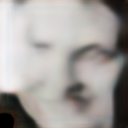

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


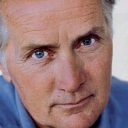

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


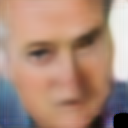

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


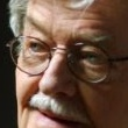

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


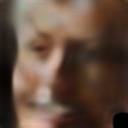

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


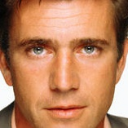

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


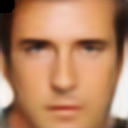

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


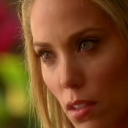

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


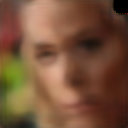

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


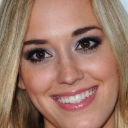

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


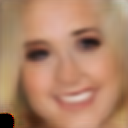

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


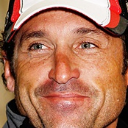

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


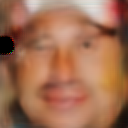

torch.Size([1, 512, 7, 7])
torch.Size([1, 25088])


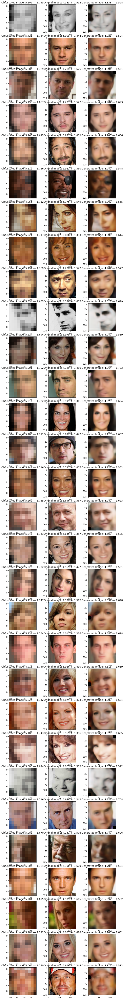

In [51]:
face_dataset_test = CelebADataset_test(df_test,transform=transforms.Compose([
                                               Rescale_test(size,size,obfuscation=True),
                                               ObfuscaionToTensor_test()
                                           ]),obfuscation=True, sigma=9)
dataloader_test = DataLoader(face_dataset_test, batch_size=batch_size,
                        shuffle=False, num_workers=num_workers)

acc=0
counter=0
counter1=0

model.eval()
# iterate over test data
counter=0
# fig = plt.figure(figsize=(25, 25))
fig, axs = plt.subplots(30, 3,figsize=(10,90))
for i_batch, sample_batched in enumerate(dataloader_test):
    images_batch,obfus_image_batch,original_image_batch, labels_batch = \
                sample_batched['image'],sample_batched['obfuscated'],sample_batched['original'], sample_batched['labels']
    img=images_batch.float()
    obf_image=obfus_image_batch.float()
    original_image = original_image_batch.float()
    target = labels_batch.long()
    if train_on_gpu:
        img, obf_image,original_image, target = img.cuda(), obf_image.cuda(),original_image.cuda(), target.cuda()
    output,_,_ = model(obf_image)
    obf_image=obf_image[0].float().detach().cpu()
    img=img[0].float().detach().cpu()
    original_image=original_image[0].float().detach().cpu()
    output=output[0].float().detach().cpu()
    meanor, stdor = image_quality(original_image)
    meanob, stdob = image_quality(img)
    meang, stdg = image_quality(output)
    
#     ax = fig.add_subplot(5, 3, i_batch+1, xticks=[], yticks=[])
#     imshow(images[idx])
#     ax.set_title(classes[labels[idx]])
    

#     obf_image=obf_image[0].float().detach().cpu()
#     img=img[0].float().detach().cpu()
#     original_image=original_image[0].float().detach().cpu()
#     output=output[0].float().detach().cpu()
    if grayscale == False:
        axs[i_batch, 0].imshow(np.transpose(original_image, (1, 2, 0)))
        axs[i_batch, 0].set_title('Obfuscated Image: %.3f +- %.3f' % (meanor, stdor))
        axs[i_batch, 1].imshow(np.transpose(img, (1, 2, 0)))
        axs[i_batch, 1].set_title('Orignal Image: %.3f +- %.3f' % (meanob, stdob))
        axs[i_batch, 2].imshow(np.transpose(output, (1, 2, 0)))
        axs[i_batch, 2].set_title('Generated Image: %.3f +- %.3f' % (meang, stdg))
    
    else:
        axs[i_batch, 0].imshow(np.transpose(original_image, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i_batch, 0].set_title('Obfuscated Image')
        axs[i_batch, 1].imshow(np.transpose(img, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i_batch, 1].set_title('Orignal Image')
        axs[i_batch, 2].imshow(np.transpose(output, (1, 2, 0)).squeeze(2), cmap=plt.get_cmap('gray'))
        axs[i_batch, 2].set_title('Generated Image')
        
    plt.savefig('C:/Users/13862/Desktop/reconstructedImage', bbox_inches='tight',pad_inches = 0)
    if i_batch==29:       
        break

In [ ]:
# def get_features(image, model, layers=None):
#     """ Run an image forward through a model and get the features for 
#         a set of layers. Default layers are for VGGNet matching Gatys et al (2016)
#     """
    
#     ## TODO: Complete mapping layer names of PyTorch's VGGNet to names from the paper
#     ## Need the layers for the content and style representations of an image
#     if layers is None:
#         layers = {'layer4':'loss',
#                   'fc': 'out'}
        
#     features = {}
#     x = image
#     # model._modules is a dictionary holding each module in the model
            
#     for name, layer in discriminator._modules.items():
#         if name=='fc':
#             x=x.view(1, -1)
# #             print(x.size())
#         x = layer(x)
# #         print(x.size())
        
#         if name in layers:
#             features[layers[name]] = x
            
#     return features

In [ ]:
# dataloader_test = DataLoader(face_dataset_test, batch_size=1,
#                         shuffle=False, num_workers=num_workers)

In [ ]:

    
# for i_batch, sample_batched in enumerate(dataloader_test):
#     if i_batch==136:
#         break
#     images_batch, landmarks_batch = \
#             sample_batched['image'], sample_batched['landmarks']
#     images=images_batch.float()
#     images.numpy()
#     labels = landmarks_batch.long()

# if train_on_gpu:
#     images = images.cuda()


# output = model(images)

# # convert output probabilities to predicted class
# _, preds_tensor = torch.max(output, 1)
# preds = np.squeeze(preds_tensor.numpy()) if not train_on_gpu else np.squeeze(preds_tensor.cpu().numpy())

# # plot the images in the batch, along with predicted and true labels
# fig = plt.figure(figsize=(25, 4))
# for idx in np.arange(batch_size):
#     ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
#     imshow(images.cpu()[idx])
#     ax.set_title("{} ({})".format(preds[idx], labels[idx]),
#                  color=("green" if preds[idx]==labels[idx].item() else "red"))
# # for idx in np.arange(batch_size):
# #     ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
# #     imshow(images.cpu()[idx])
# #     ax.set_title("{} ({})".format(preds[idx], labels[idx]),
# #                  color=("green" if preds[idx]==labels[idx].item() else "red"))

Obfuscated Image Reconstructor